##  Aim
 The goal is to predict sale prices for properties with price less than 1,500,000 USD in Argentina

 ## Business Objective
 The price of a house is based on several characteristics such as location, total area,
 number of rooms, various amenities available, etc.
 In this project, we will perform house price prediction for properties in Argentina.
 Different regression models such as Linear , Random Forest, XGBoost, etc., will be
 implemented. The model performance will be improved using techniques such as feature scaling and hyperparameter tuning.
 This house price prediction project will help us predict the price of houses based on
 various features and house properties.

### Tech stack
 Language - Python
 Libraries - sklearn, pandas, NumPy, matplotlib, seaborn, xgboos

 ## Approach
 1. Data Cleaning
 ● Importing the required libraries and reading the dataset.
 ● Preliminary exploration
 ● Check for the outliers and remove outliers.
 ● Dropping of redundant feature columns
 ● Missing value handling
 ● Regularizing the categorical columns
 2. Exploratory Data Analysis
 ● Univariate and Bivariate analysis
 ● Check for correlation
 ● Feature selection
 ● Data Scaling
 3. Model Building
 ● Data preparation
 ● Performing train test split
 ● Linear Regression
 ● Ridge Regression
 ● Lasso Regressor
 ● Random Forest Regressor
 ● K-Nearest Neighbours Regressor
 4. Model Validation
 ● Mean Squared Error
 ● R2 score
 ● Plot for residuals
 6. Fitting the model and making predictions on the test data
 7. Checking for Feature Importance



## Import the Required Libraries

In [199]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge  # noqa F401
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from category_encoders import OneHotEncoder


## Define a Function for Data Cleaning

In [275]:
def clean(filepath):
    # Read csv into a dataframe
    df= pd.read_csv(filepath)

    # subset house with price less than 1_500_000
    price= df['price_aprox_usd'] < 1500000

    # drop irrelevant columns
    df.drop(columns=['id', 'created_on',  'description', 'currency', 'title', 'image_thumbnail', 'geonames_id',], inplace= True)

    # drop lat-lon column
    df.drop(columns="lat-lon", inplace=True)

    # drop "surface_covered_m2" column
    df.drop(columns= "surface_covered_in_m2", inplace= True)

    # drop columns with more than 50% missing values
    df.drop(columns=["floor", "expenses"], inplace=True)


     # remove outliers in surface_covered 
    low, high = df['surface_total_in_m2'].quantile([0.1, 0.9])
    area = df["surface_total_in_m2"].between(low, high)
    df= df[area]

    df= df[area & price]

    # drop the low and high cardinality column/feature
    df.drop(columns= ['operation','country_name', 'properati_url', 'place_with_parent_names', 'properati_url', 'place_name'], inplace= True)

    # drop leaky columns(i.e features that can cause leakage)
    df.drop(columns=[
        'price',
        'price_aprox_local_currency',
        'price_per_m2',
        'price_usd_per_m2'
        
    ], inplace= True)

    # drop columns with multicollinearity
    df.drop(columns=['rooms'], inplace= True )

    
     
    return df





## Import and Read Dataset into DataFrame

In [276]:
df =clean(r'properati-AR-2017-07-01-properties-sell.csv')

C:\Users\HP\AppData\Local\Temp\ipykernel_5488\1878868426.py:26: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## Preliminary Exploration

In [202]:
# check the size( no of rows and columns)
df.shape

(80258, 27)

In [203]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80258 entries, 0 to 80257
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          80258 non-null  object 
 1   created_on                  80258 non-null  object 
 2   operation                   80258 non-null  object 
 3   property_type               80258 non-null  object 
 4   place_name                  80252 non-null  object 
 5   place_with_parent_names     80258 non-null  object 
 6   country_name                80258 non-null  object 
 7   state_name                  80258 non-null  object 
 8   geonames_id                 67608 non-null  float64
 9   lat-lon                     67366 non-null  object 
 10  lat                         67366 non-null  float64
 11  lon                         67366 non-null  float64
 12  price                       66675 non-null  float64
 13  currency                    666

In [195]:
df.isnull().sum()

id                                0
created_on                        0
operation                         0
property_type                     0
place_name                        6
place_with_parent_names           0
country_name                      0
state_name                        0
geonames_id                   12650
lat-lon                       12892
lat                           12892
lon                           12892
price                         13583
currency                      13583
price_aprox_local_currency    13583
price_aprox_usd               13583
surface_total_in_m2           22953
surface_covered_in_m2         11518
price_usd_per_m2              35200
price_per_m2                  21757
floor                         71752
rooms                         26828
expenses                      73083
properati_url                     0
description                       2
title                             0
image_thumbnail                 805
dtype: int64

In [197]:
# check for duplicates values
df.duplicated().any()

False

After the preliminary exploration. Somethings were revealed. The first step is to subset the data for properties less than 1,500,000 usd. The data contains 80258 rows and 27 columns. It is noted that some columns are irrelevant for our analysis and will have to be dropped. Columns like 'ID', 'create on', 'operation', 'country -name','geonames_id', 'properati_url','description','title','image_thumbnail' will not be used in the analysis and can be removed.The Data also has several missing columns and will be handled approriately. There no duplicates. The "lat-lon" column will also be dropped because there "lat" and "lon" columns are in a seperate column each. Sizes and locations are important factor to determining house price, hence we will focus our analysis on these parameters. 

Since we're using a function to import and clean our data, we'll need to make most of the changes iteratively there.

### Handling Missing values 

There are missing values in some columns and we will handle 

we will drop columns with more than 50% missing values and this will be done by modifying the clean functions to drop 'floor' and 'expenses' columns.

there is missing values in 'price_aprox_usd' and will impute:

In [247]:
# Fill missing values in 'price_approx_usd' with the mean
df['price_aprox_usd'].fillna(df['price_aprox_usd'].mean(), inplace=True)

In [265]:
df.isnull().sum()

property_type              0
state_name                 0
lat                     6242
lon                     6242
price_aprox_usd            0
surface_total_in_m2        0
price_usd_per_m2           0
floor                  35280
rooms                  12798
dtype: int64

### Check for categorical column with low or high cardinality

we need to look out for are categorical columns with low or high cardinality. If there's only one category in a column, it won't provide any unique information to our model. At the other extreme, columns where nearly every row has its own category won't help our model in identifying useful trends in the data.

In [249]:
df.select_dtypes("object").nunique()

operation                      1
property_type                  4
place_name                   702
place_with_parent_names      762
country_name                   1
state_name                    25
properati_url              38968
dtype: int64

we can see that columns like "country_name" and "operation" have only one value in them, while columns "place_with_parent_names And "place_name  has over alot of unique value. very row in "properati_url" has a unique value.  These are clear examples of high- and low-cardinality features that we shouldn't include in our model. For that we will drop these columns by modifying the clean function


### Data leakage 

It's also important for us to drop any columns that would constitute leakage, that is, features that were created using our target or that would give our model information that it won't have access to when it's deployed. we have three columns related to price namely 'price_aprox_local_currency', 'price_aprox_usd', 'price_usd_per_m2', ' price_per_m2'.
we will only keep "price_aprox_usd" and drop the others. Again, we will modify the clean function to drop the other price columns

In [261]:
df.shape

(38968, 9)

In [262]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38968 entries, 16 to 80257
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   property_type        38968 non-null  object 
 1   state_name           38968 non-null  object 
 2   lat                  32726 non-null  float64
 3   lon                  32726 non-null  float64
 4   price_aprox_usd      38968 non-null  float64
 5   surface_total_in_m2  38968 non-null  float64
 6   price_usd_per_m2     38968 non-null  float64
 7   floor                3688 non-null   float64
 8   rooms                26170 non-null  float64
dtypes: float64(7), object(2)
memory usage: 3.0+ MB


After the first cleaning stage:  we are left with 38968 rows and 9 columns

In [218]:
# check the spread of the sizes
df[['surface_total_in_m2', 'surface_covered_in_m2']].describe()

,surface_total_in_m2,surface_covered_in_m2
count,57305.000000,6.874000e+04
mean,263.887322,2.921983e+04
std,2213.914491,7.628255e+06
min,0.000000,0.000000e+00
25%,46.000000,4.500000e+01
50%,85.000000,7.500000e+01
75%,225.000000,1.520000e+02
max,200000.000000,2.000000e+09


exploring the sizes of the properties, there are properties with zero square meter which is impossible. Also, the maximum value in surface_total_in_m2 is 200_000 and the maximum value in surface_covered_in_m2 is 2billion. The value in surface_total_in_m2 seems to be more realistic figure. for that, we will drop surface_covered_in_m2

## EXPLORATORY DATA ANALYSIS

Create a histogram of "surface_total_in_m2" to see the distribution

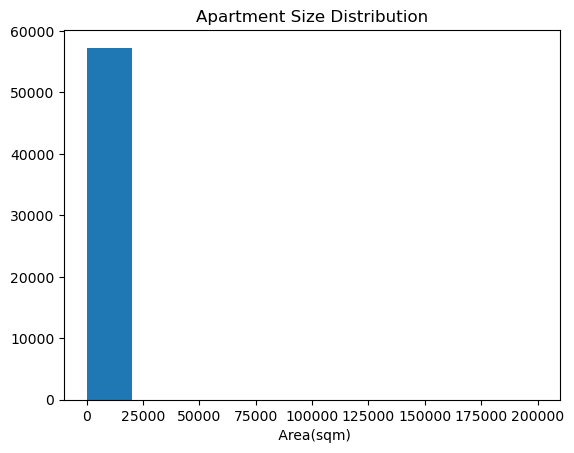

In [219]:
plt.hist(df['surface_total_in_m2'])
plt.title("Apartment Size Distribution")
plt.xlabel(" Area(sqm)");

This shows there is presence of outliers. Let's explore using boxplot

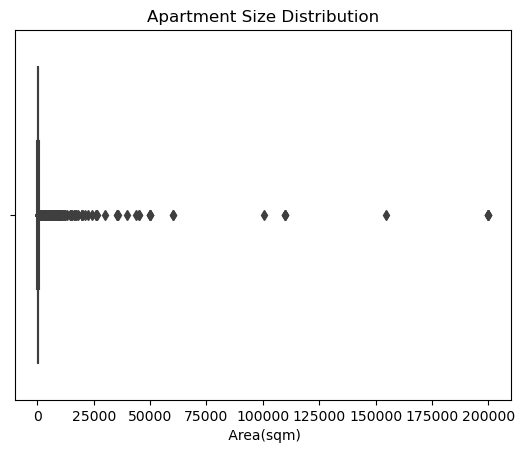

In [220]:
sns.boxplot(df, x= "surface_total_in_m2")
plt.title("Apartment Size Distribution")
plt.xlabel(" Area(sqm)");

In [221]:
df['surface_total_in_m2'].describe()

count     57305.000000
mean        263.887322
std        2213.914491
min           0.000000
25%          46.000000
50%          85.000000
75%         225.000000
max      200000.000000
Name: surface_total_in_m2, dtype: float64

The statistics confirmed our suspicion about the prescence of outliers in the sizes of propretie(ssurface_total_in_m2) data. 75% of our dataset are smaller than 225 square meters, there are some properties that are high as having 200_000 square meters. This can affect the performance of linear model. to avoid this, we will handle the outliers by removing them. we will modify the clean function

In [38]:
#low, high = df["surface_total_in_m2"].quantile([0.1, 0.9])
#area = df["surface_total_in_m2"].between(low, high)
# we will include this in the clean function

Let's visualise the column again

In [226]:
df['surface_total_in_m2'].describe()

count    46280.000000
mean       132.606698
std        109.838559
min         30.000000
25%         52.000000
50%         85.000000
75%        187.000000
max        500.000000
Name: surface_total_in_m2, dtype: float64

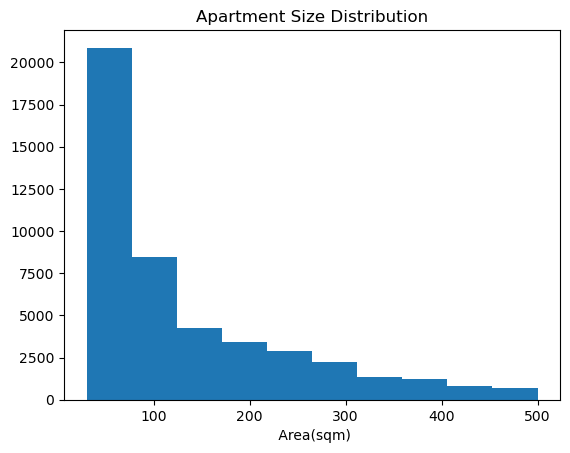

In [228]:
plt.hist(df['surface_total_in_m2'])
plt.title("Apartment Size Distribution")
plt.xlabel(" Area(sqm)");

Let's explore price_approx_usd

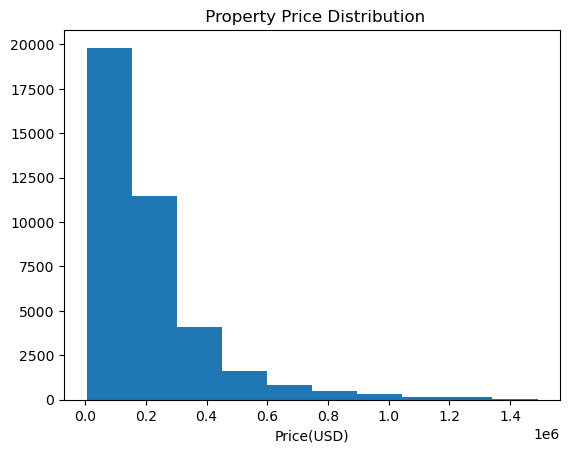

In [235]:
plt.hist(df['price_aprox_usd'])
plt.title(" Property Price Distribution")
plt.xlabel("Price(USD)");

In [236]:
df['price_aprox_usd'].describe()

count    3.896800e+04
mean     2.164537e+05
std      1.911985e+05
min      4.956620e+03
25%      9.500000e+04
50%      1.500000e+05
75%      2.620000e+05
max      1.490000e+06
Name: price_aprox_usd, dtype: float64

<Axes: xlabel='price_aprox_usd'>

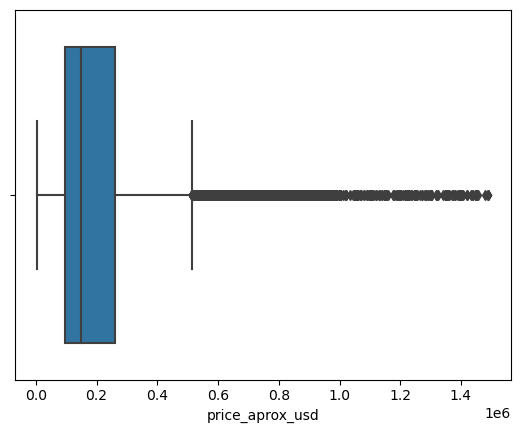

In [237]:
sns.boxplot(df,x='price_aprox_usd');

Create scatter plot to show the relationship between house price and surface area

In [174]:
df.columns

Index(['property_type', 'place_name', 'state_name', 'lat', 'lon',
       'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2',
       'price_usd_per_m2'],
      dtype='object')

Text(0.5, 1.0, 'Price VS Area')

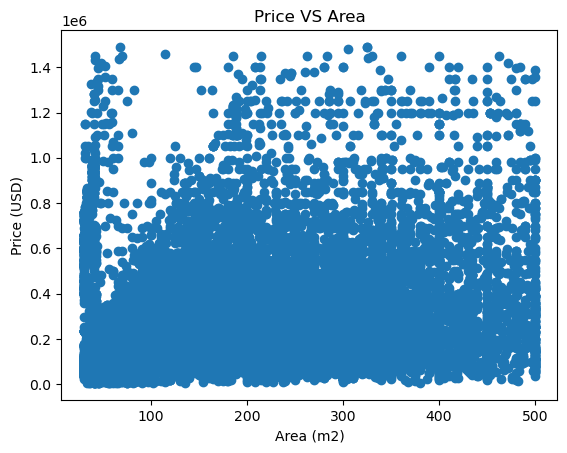

In [238]:
plt.scatter(x=df['surface_total_in_m2'], y=df['price_aprox_usd'])
plt.xlabel("Area (m2)")
plt.ylabel("Price (USD)")
plt.title("Price VS Area")

### Let'explore location using latitude and longtitude

In [240]:
import plotly.express as px

In [104]:

fig= px.scatter_mapbox(
    df, lat= "lat", lon= "lon", width= 600,height= 600, color= "price_aprox_usd",
    hover_data= ['price_aprox_usd']
)

fig.update_layout(mapbox_style= "open-street-map")
fig.show()

In [68]:
# Create 3D scatter plot
fig = px.scatter_3d(
    df,
    x="lon",
    y="lat",
    z="price_aprox_usd",
    labels={"lon": "longitude", "lat": "latitude", "price_aprox_usd": "price"},
    width=600,
    height=500,
)

# Refine formatting
fig.update_traces(
    marker={"size": 4, "line": {"width": 2, "color": "DarkSlateGrey"}},
    selector={"mode": "markers"},
)

# Display figure
fig.show()

From the plots, we can see concentration of properties in certain area. This is expected and normal. Majority of the properties is around 200,000 USD

### Let's explore State

In [93]:
df['state_name'].nunique()

25

There are 25 states as captured in th data.

<Axes: xlabel='count', ylabel='state_name'>

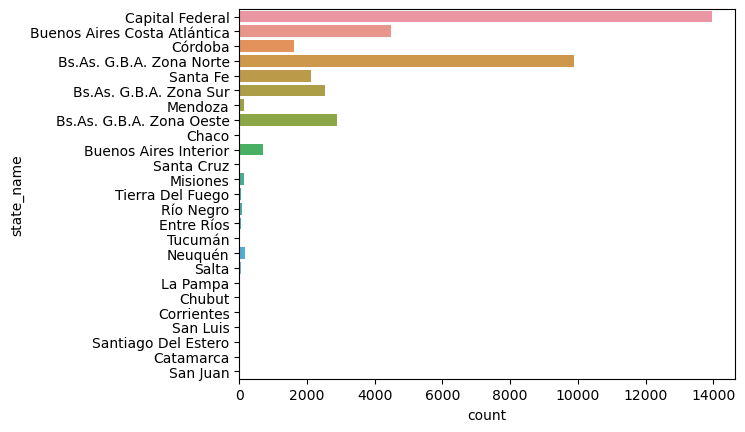

In [95]:
sns.countplot(df, y= 'state_name')

In [98]:
state_count= df['state_name'].value_counts()
# create the funnel plot
fig = px.funnel(df, y=state_count.index, x=state_count.values, title='State Distribution')
fig.show()

what is the average house price of houses in states in Argentina?

In [102]:
state_group = df.groupby("state_name")
avPrice_state= state_group["price_aprox_usd"].mean().sort_values(ascending= False).round()
avPrice_state

state_name
Río Negro                       301220.0
Mendoza                         278736.0
Bs.As. G.B.A. Zona Norte        264724.0
Capital Federal                 252688.0
La Pampa                        242681.0
Buenos Aires Interior           202834.0
Catamarca                       197184.0
San Luis                        197124.0
Chubut                          189105.0
Corrientes                      180245.0
Tierra Del Fuego                176137.0
Chaco                           168872.0
Bs.As. G.B.A. Zona Sur          166094.0
Salta                           159281.0
Neuquén                         151906.0
Bs.As. G.B.A. Zona Oeste        151512.0
Santa Fe                        149163.0
Entre Ríos                      145967.0
Tucumán                         141836.0
Buenos Aires Costa Atlántica    139211.0
Santa Cruz                      134475.0
Córdoba                         126024.0
Misiones                        109206.0
Santiago Del Estero              46920.0
San J

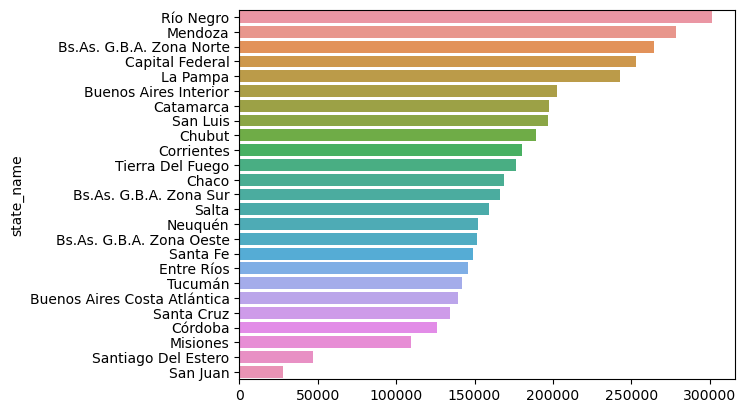

In [103]:
sns.barplot(df, x= avPrice_state.values, y= avPrice_state.index)
plt.xlabel("Average House Price")
plt.ylabel("State");

Based on the data, houses in Rio Negro are the most expensive based on the average price and San Juan has the least expensive house.

In [241]:
# create a Mapbox scatter plot that shows the location of the apartments in df
fig = px.scatter_mapbox(
    df, #Our dataframe
    lat='lat',
    lon='lon',
    width = 1000, #with of the map
    height= 600, #height og the map
    color='price_aprox_usd',
    hover_data =['state_name'], # Display price when hovering mouse over house
    opacity=1,
    zoom=4.0
    
)

fig.update_layout(mapbox_style='open-street-map')

fig.show()

The data reveals that majority of the properties is less than 0.2M USD. Also, It is observed that major cities have colours indicating high and low cost   

### Let's explore the property_type

In [242]:
df['property_type'].unique()

array(['apartment', 'house', 'PH', 'store'], dtype=object)

there are four types of property as captured in the data, namely: apartment, house, store, and PH. **propiedad horizontal*** which also means condominium.

In [73]:
type_count= df['property_type'].value_counts()
type_count

property_type
apartment    24921
house        10694
PH            2461
store          892
Name: count, dtype: int64

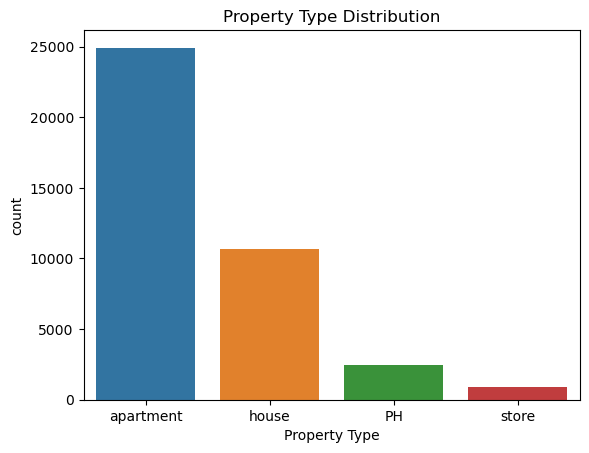

In [244]:
sns.countplot(df, x="property_type")
plt.title( "Property Type Distribution")
plt.xlabel("Property Type");

The analysis revealed that apartment is the dominant type of house in Argentina as captured in the data while store is the least common type of apartment.


Which property type is the most expensive in Argentina

In [245]:
type_group= df.groupby("property_type")
group_price= type_group['price_aprox_usd'].mean().sort_values(ascending=False).round()
group_price

property_type
store        279391.0
house        275524.0
apartment    195795.0
PH           146161.0
Name: price_aprox_usd, dtype: float64

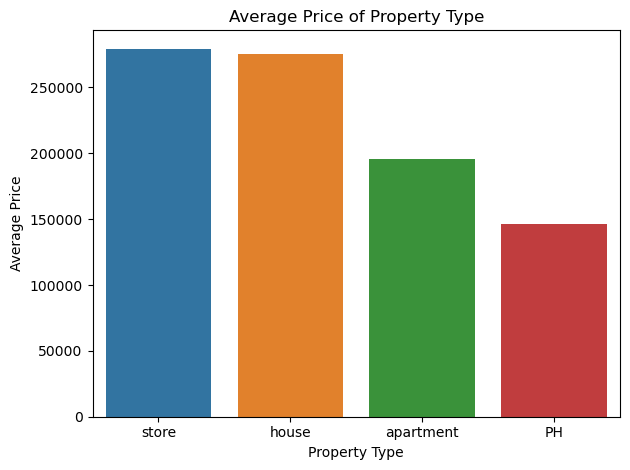

In [246]:
sns.barplot(df, x= group_price.index, y=group_price.values)
plt.xlabel("Property Type")
plt.ylabel("Average Price")
plt.title("Average Price of Property Type")
plt.tight_layout()

Store is the most expensive type of property in Argentina. Although, the difference between store and house price is about 500 USD.The condominium is the least expensive on average.

### checking for multicolinearity in the features

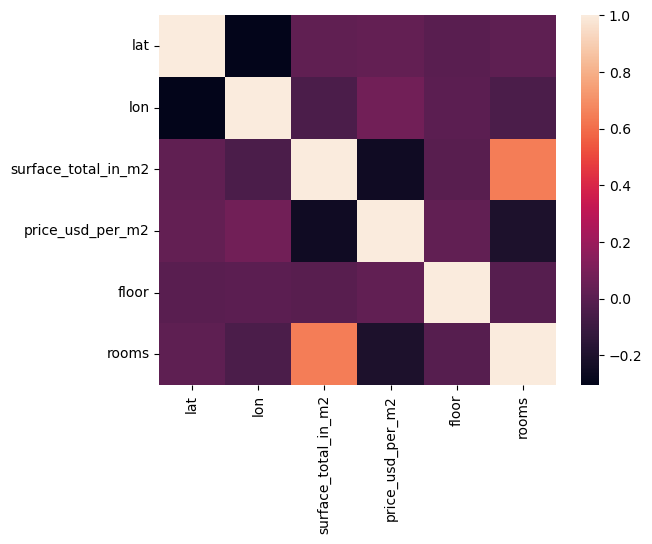

In [263]:
# check for multicollinearity 
corr = df.select_dtypes("number").drop(columns= "price_aprox_usd").corr()
sns.heatmap(corr);

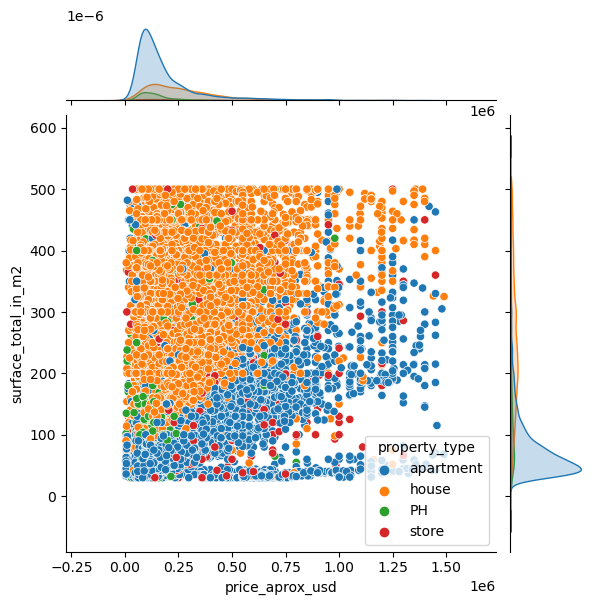

In [149]:
sns.jointplot(df, x="price_aprox_usd", y= "surface_total_in_m2", hue= "property_type");

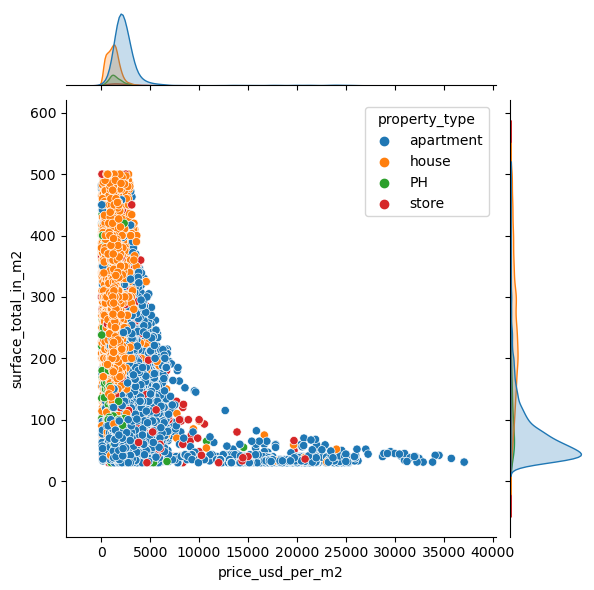

In [150]:
sns.jointplot(df, x="price_usd_per_m2", y= "surface_total_in_m2", hue= "property_type");

## Model Building

Data preparation
 ● Performing train test split
 ● Linear Regression
 ● Ridge Regression
 ● Lasso Regressor
 ● Elastic Net
 ● Random Forest Regressor
 ● XGBoost Regressor
 ● K-Nearest Neighbours Regressor
 ● Support Vector Regressor

### Feature Selection

Define the features and target

In [284]:
df.shape

(38968, 6)

In [278]:
df.columns

Index(['property_type', 'state_name', 'lat', 'lon', 'price_aprox_usd',
       'surface_total_in_m2'],
      dtype='object')

In [414]:
target= "price_aprox_usd"
features= ['property_type', 'state_name', 'lat', 'lon', 'surface_total_in_m2']
X= df[features]
y= df[target]

### Split data into train and test set

In [415]:
X_train, X_test, y_train, y_test= train_test_split(X,y, test_size=0.30, random_state=42)

Baseline Model

The first step in building a model is baselining. This is to help us measure if the model we built is performing well.One way to think about this is to see how a "dumb" model would perform on the same data. It is always a model that makes only one prediction — it predicts the same price regardless of an apartment's size and location.

In [285]:
y_mean= y_train.mean().round()
y_pred_base= [y_mean] * len(y_train)
print(f"Mean house Price: {y_mean}")
print("Baseline MAE:", mean_absolute_error(y_train, y_pred_base))

Mean house Price: 216949.0
Baseline MAE: 132453.97162334566


In [287]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38968 entries, 16 to 80257
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   property_type        38968 non-null  object 
 1   state_name           38968 non-null  object 
 2   lat                  32726 non-null  float64
 3   lon                  32726 non-null  float64
 4   surface_total_in_m2  38968 non-null  float64
dtypes: float64(3), object(2)
memory usage: 1.8+ MB


There are still missing values in the "lat" and "lon" columns and we will Simple Imputer to handle it. Also, the property type and state name are categorical and we will encode them with OneHotEncoder transformer. This two transformation will be done with pipeline.

## Linear Regression

In [295]:
# Create a pipeline named model that contains a OneHotEncoder, SimpleImputer, and Linear Regression predictor.
lr_model = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    LinearRegression()
)

lr_model.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('linearregression', LinearRegression())])

In [296]:
lr_y_pred= lr_model.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, lr_y_pred))

Training MAE: 99429.22972569875


In [297]:
lr_accuracy=r2_score(y_train, lr_y_pred)
lr_accuracy

0.31894601202467954

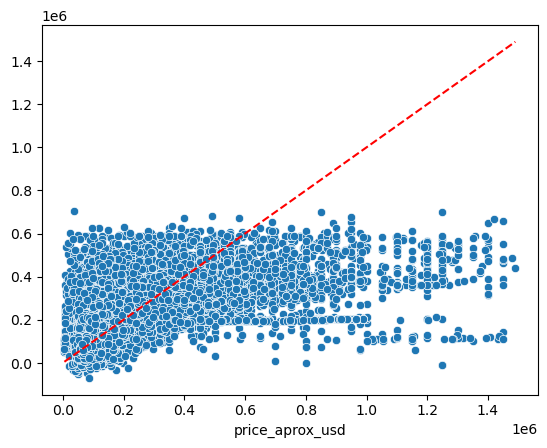

In [299]:
sns.scatterplot(x= y_train, y = lr_y_pred)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)],"--", color="red")

## Lasso Regression

In [132]:

from sklearn.linear_model import Lasso

In [306]:
# Create a pipeline named model that contains a OneHotEncoder, SimpleImputer, and Lasso predictor.
lassoModel = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    Lasso()
)

lassoModel.fit(X_train, y_train)

c:\Users\HP\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.928e+14, tolerance: 1.012e+11



Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()), ('lasso', Lasso())])

In [307]:
la_y_pred=lassoModel.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, la_y_pred))

Training MAE: 99426.14550647205


In [321]:
Train_accuracy=r2_score(y_train, la_y_pred)
Train_accuracy

0.3189434373061112

## Ridge

In [329]:
# Create a pipeline named model that contains a OneHotEncoder, SimpleImputer, and Lasso predictor.
RidgeModel = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    Ridge()
)

RidgeModel.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()), ('ridge', Ridge())])

In [330]:
R_y_pred= RidgeModel.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, R_y_pred))

Training MAE: 99428.62918367819


### Data Scaling

Feature Transformation with Normalisation

In [334]:
from sklearn.preprocessing import StandardScaler

In [335]:
# Define your pipeline
lr3_model = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    StandardScaler(),  # Add StandardScaler here
    LinearRegression()
)
# Fit the pipeline to your training data
lr3_model.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [336]:
lr3_y_pred= lr3_model.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, lr3_y_pred))

Training MAE: 99079.00566726347


In [332]:
from sklearn.preprocessing import MinMaxScaler

In [326]:
# Define your pipeline
lr2_model = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    StandardScaler(),  # Add StandardScaler here
    LinearRegression()
)
# Fit the pipeline to your training data
lr2_model.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [328]:
lr2_y_pred= lr2_model.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, lr2_y_pred))

Training MAE: 99079.00566726347


In [338]:
RidgeModel2 = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    StandardScaler(),
    Ridge()
)

RidgeModel2.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()), ('ridge', Ridge())])

In [339]:
y_ridge= RidgeModel2.predict(X_train)
print("Training MAE:", mean_absolute_error(y_train, y_ridge))


Training MAE: 99428.82360436954


In [340]:
Train_accuracy=r2_score(y_train, y_ridge)
Train_accuracy

0.3189460105964821

The model performance is not good with linear model. let's try to build tree model

### Decision Tree Model

In [341]:
from sklearn.tree import DecisionTreeRegressor

In [342]:
# Create a pipeline named model that contains a OneHotEncoder, SimpleImputer, and Lasso predictor.
DTR = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    DecisionTreeRegressor()
)

DTR.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('decisiontreeregressor', DecisionTreeRegressor())])

In [343]:
DTR_pred= DTR.predict(X_train)

In [346]:

print("Training MAE:", mean_absolute_error(y_train, DTR_pred))


Training MAE: 11856.502012091898


In [347]:
acc= r2_score(y_train, DTR_pred)
acc

0.9287103972219392

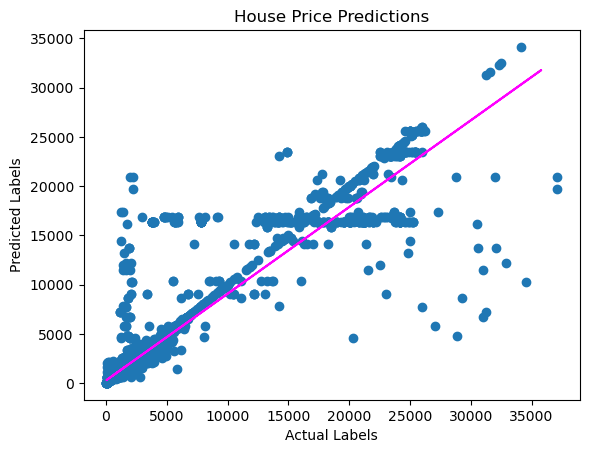

In [182]:
# Plot predicted vs actual
plt.scatter(y_train, DTR_pred)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('House Price Predictions')
# overlay the regression line
z = np.polyfit(y_train, DTR_pred, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

Try an Ensemble Algorithm
Ensemble algorithms work by combining multiple base estimators to produce an optimal model, either by applying an aggregate function to a collection of base models (sometimes referred to a bagging) or by building a sequence of models that build on one another to improve predictive performance (referred to as boosting).

For example, let's try a Random Forest model, which applies an averaging function to multiple Decision Tree models for a better overall model.

In [416]:
from sklearn.ensemble import RandomForestRegressor

In [417]:
RFR_model = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    RandomForestRegressor()
)

RFR_model.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['property_type', 'state_name'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('randomforestregressor', RandomForestRegressor())])

In [418]:
RFR_pred= RFR_model.predict(X_train)

In [354]:
maeRFR= mean_absolute_error(y_train, RFR_pred)
accRFR= r2_score(y_train, RFR_pred)
print(maeRFR)
print(accRFR)

27736.36161463121
0.896017755523855


## Fitting the model and making predictions on the test data

In [363]:
y_test_pred= DTR.predict(X_test)

In [370]:
y_test_pred2= RidgeModel.predict(X_test)

In [376]:
print("validation MAE for Ridge:", mean_absolute_error(y_test, y_test_pred2))


validation MAE for Ridge: 96718.70792535202


In [378]:
accuracy= r2_score(y_test, y_test_pred2)
accuracy

0.332742813414328

Test on Random Forest

In [419]:
y_test_pred3= RFR_model.predict(X_test)

In [380]:
maeRFR= mean_absolute_error(y_test, y_test_pred3)
accRFR= r2_score(y_test, y_test_pred3)
print(maeRFR)
print(accRFR)

56349.84653084509
0.652788549950104


In [420]:
maeRFR= mean_absolute_error(y_test, y_test_pred3)
accRFR= r2_score(y_test, y_test_pred3)
print(maeRFR)
print(accRFR)

56290.519104168176
0.6539460600087774


In [367]:
X.columns

Index(['property_type', 'state_name', 'lat', 'lon', 'surface_total_in_m2'], dtype='object')

### The RandomForest model gave us the best performance. Ofcourse, there are alot of techniques that can be usedfor improving the perfomance of the model

## Communicate Result

In many data science projects, however, communication means giving stakeholders tools they can use to deploy a model — in other words, use it in action. So let's look at two ways you might deploy this model.

In [425]:
X_train.columns

Index(['property_type', 'state_name', 'lat', 'lon', 'surface_total_in_m2'], dtype='object')

In [ ]:
def make_prediction(area, lat, lon,):
    data= {
        "surface_total_in_m2": area,
        "lat": lat,
        "lon": lon,
        "neighborhood":neighborhood
    }
    df= pd.DataFrame(data, index=[0])
    prediction = RFR_model.predict(df).round(2)[0]
    return f"Predicted apartment price: ${prediction}"

In [426]:
def predict_property_price(property_type, state_name, lat, lon, surface_total_in_m2):
    
    feature = {    
        'surface_total_in_m2':surface_total_in_m2,
        'lat':lat,
        'lon':lon,
        'state_name':state_name,
        'property_type':property_type
    }
    
    df = pd.DataFrame(feature, index=[0])
    prediction = RFR_model.predict(df).round(2)[0]
    return f'The predicted house price in Argentina: ${prediction}' 

In [434]:
X_train.columns

Index(['property_type', 'state_name', 'lat', 'lon', 'surface_total_in_m2'], dtype='object')

In [438]:
def predict_property_price(property_type, state_name, lat, lon, surface_total_in_m2):
    feature = { 
        'property_type': property_type,
        'state_name': state_name,   
        'lat': lat,
        'lon': lon,
        'surface_total_in_m2': surface_total_in_m2
        
        
    }
    
    df = pd.DataFrame(feature, index=[0])
    prediction = RFR_model.predict(df).round(2)[0]
    return f'The predicted house price in Argentina: ${prediction}'


In [439]:
predict_property_price('apartment', 'Capital Federal',-46.63,-58.45,33.0)

'The predicted house price in Argentina: $379904.71'